## Table of Contents
<ul>
<li><a href="#intro">Introduction</a></li>
<li><a href="#load_understand_data">Load and understand dataset</a></li>
<li><a href="#eda">EDA and Data Cleaning</a></li>
<li><a href="#target_encoding">Encoding multiclass target</a></li>
<li><a href="#splitting">Data splitting</a></li>
<li><a href="#outlier">Outlier removing</a></li>
<li><a href="#scaling">Scaling</a></li>
<li><a href="#remove_collinear_features">Remove collinear features</a></li> 
<li><a href="#modeling">Modeling</a></li>
<li><a href="#handling_imbalanced_data">Modeling after handling imbalanced data</a></li>
</ul>

<a id='intro'></a>
## Introduction
> Seven different types of dry beans were used in this research, taking into account the features such as form, shape, type, and structure by the market situation. A computer vision system was developed to distinguish seven different registered varieties of dry beans with similar features in order to obtain uniform seed classification. For the classification model, images of 13,611 grains of 7 different registered dry beans were taken with a high-resolution camera. Bean images obtained by computer vision system were subjected to segmentation and feature extraction stages, and a total of 16 features; 12 dimensions and 4 shape forms, were obtained from the grains.

### Attribute Information:

**Area (A)**: The area of a bean zone and the number of pixels within its boundaries.

**Perimeter (P)**: Bean circumference is defined as the length of its border.

**Major axis length (L)**: The distance between the ends of the longest line that can be drawn from a bean.

**Minor axis length (l)**: The longest line that can be drawn from the bean while standing perpendicular to the main axis.

**Aspect ratio (K)**: Defines the relationship between L and l.

**Eccentricity (Ec)**: Eccentricity of the ellipse having the same moments as the region.

**Convex area (C)**: Number of pixels in the smallest convex polygon that can contain the area of a bean seed.

**Equivalent diameter (Ed)**: The diameter of a circle having the same area as a bean seed area.

**Extent (Ex)**: The ratio of the pixels in the bounding box to the bean area.

**Solidity (S)**: Also known as convexity. The ratio of the pixels in the convex shell to those found in beans.

**Roundness (R)**: Calculated with the following formula: (4piA)/(P^2)

**Compactness (CO)**: Measures the roundness of an object: Ed/L

**ShapeFactor1 (SF1)**

**ShapeFactor2 (SF2)**

**ShapeFactor3 (SF3)**

**ShapeFactor4 (SF4)**

**Class**: (Seker, Barbunya, Bombay, Cali, Dermosan, Horoz and Sira)

<a id='load_understand_data'></a>
## Load and  understand data

In [1]:
### import important libraries
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
from feature_engine.imputation import MeanMedianImputer
import statsmodels.api as sm
import seaborn as sns
sns.set()
from sklearn.model_selection import train_test_split
from feature_engine.encoding import OneHotEncoder
from feature_engine.encoding import OrdinalEncoder
import scipy.stats as stats
from feature_engine.encoding import RareLabelEncoder
from feature_engine.encoding import MeanEncoder
from feature_engine.outliers import OutlierTrimmer
from sklearn.linear_model import LinearRegression
from sklearn import metrics
from feature_engine.encoding import CountFrequencyEncoder
import math
from sklearn.preprocessing import OrdinalEncoder
from sklearn.preprocessing import StandardScaler
from sklearn.neighbors import KNeighborsRegressor
from sklearn.tree import DecisionTreeClassifier
from sklearn.preprocessing import OrdinalEncoder
from sklearn.metrics import accuracy_score, precision_score, recall_score, f1_score, confusion_matrix
from sklearn.linear_model import LogisticRegression
from sklearn.metrics import classification_report
from sklearn.neighbors import KNeighborsClassifier
from imblearn.under_sampling import NearMiss
from dataprep.eda import plot, plot_correlation, create_report, plot_missing
#oversample
from imblearn.over_sampling import SMOTE
from imblearn.over_sampling import BorderlineSMOTE
from imblearn.over_sampling import SVMSMOTE
from imblearn.over_sampling import ADASYN

#over+under
from imblearn.combine import SMOTETomek
from imblearn.combine import SMOTEENN

#models
from sklearn.linear_model import SGDClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn.svm import SVC
from sklearn.tree import DecisionTreeClassifier
from xgboost import XGBClassifier
from sklearn.linear_model import LogisticRegression



#utils
import itertools
import time
from tqdm import tqdm
import warnings
warnings.filterwarnings("ignore")

#metrics
from sklearn.metrics import fbeta_score
from sklearn.metrics import balanced_accuracy_score
from sklearn.metrics import roc_auc_score
from imblearn.metrics import geometric_mean_score

In [2]:
data=pd.read_excel("Dry_Bean_Dataset.xlsx")

In [3]:
data.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 13611 entries, 0 to 13610
Data columns (total 18 columns):
 #   Column           Non-Null Count  Dtype  
---  ------           --------------  -----  
 0   Bean ID          13611 non-null  int64  
 1   Area             13611 non-null  int64  
 2   Perimeter        13611 non-null  float64
 3   MajorAxisLength  13611 non-null  float64
 4   MinorAxisLength  13611 non-null  float64
 5   AspectRation     13611 non-null  float64
 6   Eccentricity     13611 non-null  float64
 7   ConvexArea       13611 non-null  int64  
 8   EquivDiameter    13611 non-null  float64
 9   Extent           13611 non-null  float64
 10  Solidity         13611 non-null  float64
 11  roundness        13611 non-null  float64
 12  Compactness      13611 non-null  float64
 13  ShapeFactor1     13611 non-null  float64
 14  ShapeFactor2     13611 non-null  float64
 15  ShapeFactor3     13611 non-null  float64
 16  ShapeFactor4     13611 non-null  float64
 17  Class       

In [11]:
### we see that dataset has no missing values

### Statistical Summary

In [12]:
data.describe()

,Bean ID,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000,13611.000000
mean,6806.000000,53048.284549,855.283459,320.141867,202.270714,1.583242,0.750895,53768.200206,253.064220,0.749733,0.987143,0.873282,0.799864,0.006564,0.001716,0.643590,0.995063
std,3929.301592,29324.095717,214.289696,85.694186,44.970091,0.246678,0.092002,29774.915817,59.177120,0.049086,0.004660,0.059520,0.061713,0.001128,0.000596,0.098996,0.004366
min,1.000000,20420.000000,524.736000,183.601165,122.512653,1.024868,0.218951,20684.000000,161.243764,0.555315,0.919246,0.489618,0.640577,0.002778,0.000564,0.410339,0.947687
25%,3403.500000,36328.000000,703.523500,253.303633,175.848170,1.432307,0.715928,36714.500000,215.068003,0.718634,0.985670,0.832096,0.762469,0.005900,0.001154,0.581359,0.993703
50%,6806.000000,44652.000000,794.941000,296.883367,192.431733,1.551124,0.764441,45178.000000,238.438026,0.759859,0.988283,0.883157,0.801277,0.006645,0.001694,0.642044,0.996386
75%,10208.500000,61332.000000,977.213000,376.495012,217.031741,1.707109,0.810466,62294.000000,279.446467,0.786851,0.990013,0.916869,0.834270,0.007271,0.002170,0.696006,0.997883
max,13611.000000,254616.000000,1985.370000,738.860153,460.198497,2.430306,0.911423,263261.000000,569.374358,0.866195,0.994677,0.990685,0.987303,0.010451,0.003665,0.974767,0.999733


<a id='eda'></a>
## EDA and Data Cleaning

In [4]:
#Drop ID Columns which won't be use for building model
data.drop('Bean ID',axis=1,inplace=True)

In [5]:
## drop duplicate values
data.drop_duplicates(inplace=True)

In [6]:
data.reset_index(drop=True,inplace=True)

In [7]:
data

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13538,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13539,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13540,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13541,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


### EDA

  0%|                                                                                         | 0/1291 [00:00<…


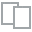
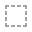
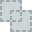
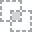
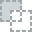
...
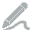
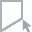
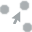
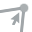
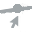

In [26]:
plot(data)

  0%|                                                                                         | 0/3437 [00:00<…

DataPrep Report
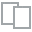
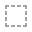
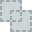
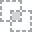
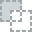
...
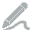
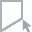
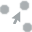
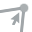
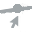

In [29]:
create_report(data)

We get some solid insights from these tables and graphs. Features interactions, correlations and get information about missing values  

<a id='target_encoding'></a>
## Encoding multiclass target

In [8]:
dry=data

In [9]:
dry

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4,Class
0,28395,610.291,208.178117,173.888747,1.197191,0.549812,28715,190.141097,0.763923,0.988856,0.958027,0.913358,0.007332,0.003147,0.834222,0.998724,SEKER
1,28734,638.018,200.524796,182.734419,1.097356,0.411785,29172,191.272750,0.783968,0.984986,0.887034,0.953861,0.006979,0.003564,0.909851,0.998430,SEKER
2,29380,624.110,212.826130,175.931143,1.209713,0.562727,29690,193.410904,0.778113,0.989559,0.947849,0.908774,0.007244,0.003048,0.825871,0.999066,SEKER
3,30008,645.884,210.557999,182.516516,1.153638,0.498616,30724,195.467062,0.782681,0.976696,0.903936,0.928329,0.007017,0.003215,0.861794,0.994199,SEKER
4,30140,620.134,201.847882,190.279279,1.060798,0.333680,30417,195.896503,0.773098,0.990893,0.984877,0.970516,0.006697,0.003665,0.941900,0.999166,SEKER
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
13538,42097,759.696,288.721612,185.944705,1.552728,0.765002,42508,231.515799,0.714574,0.990331,0.916603,0.801865,0.006858,0.001749,0.642988,0.998385,DERMASON
13539,42101,757.499,281.576392,190.713136,1.476439,0.735702,42494,231.526798,0.799943,0.990752,0.922015,0.822252,0.006688,0.001886,0.676099,0.998219,DERMASON
13540,42139,759.321,281.539928,191.187979,1.472582,0.734065,42569,231.631261,0.729932,0.989899,0.918424,0.822730,0.006681,0.001888,0.676884,0.996767,DERMASON
13541,42147,763.779,283.382636,190.275731,1.489326,0.741055,42667,231.653248,0.705389,0.987813,0.907906,0.817457,0.006724,0.001852,0.668237,0.995222,DERMASON


In [10]:
ordinal_mapping = {k: i
                   for i, k in enumerate(data['Class'].value_counts(ascending=True).index)
                  }
ordinal_mapping

{'BOMBAY': 0,
 'BARBUNYA': 1,
 'CALI': 2,
 'HOROZ': 3,
 'SEKER': 4,
 'SIRA': 5,
 'DERMASON': 6}

In [11]:
data["Class"]=data["Class"].map(ordinal_mapping)

<a id='splitting'></a>
## Data splitting

In [12]:
y=data["Class"]
X=data.drop("Class",axis=1)

X_train, X_test, y_train, y_test = train_test_split(
    X,y, test_size=0.25, random_state=0)

X_train.shape, X_test.shape

((10157, 16), (3386, 16))

<a id='outlier'></a>
## Outlier removing

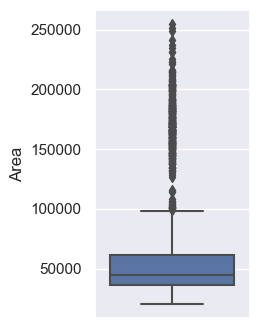

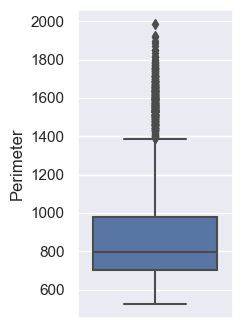

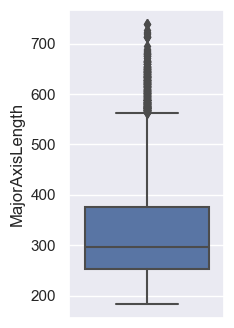

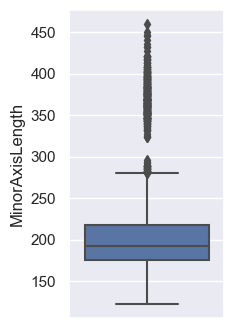

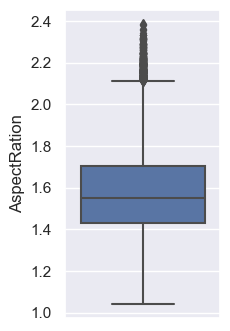

...

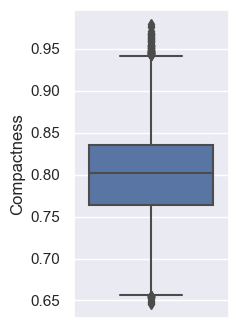

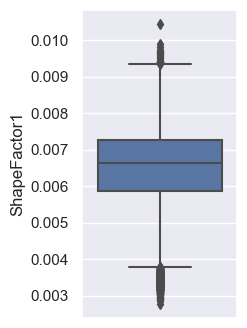

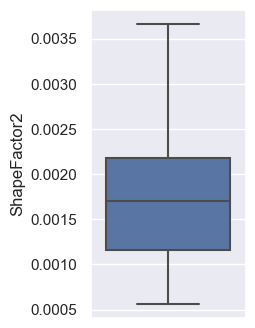

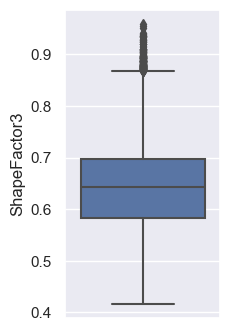

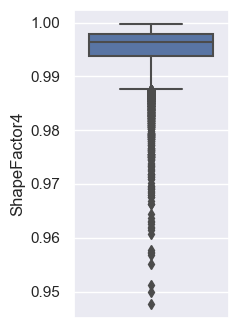

In [41]:
for i in X_train.columns:
    plt.figure(figsize=(2, 4))
    sns.boxplot(y=X_train[i])

In [42]:
X_train.describe()

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
count,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000,10157.000000
mean,53180.248695,855.832663,320.154917,202.596505,1.580738,0.750009,53899.330806,253.280721,0.749943,0.987170,0.873710,0.800504,0.006556,0.001719,0.644613,0.995102
std,29600.642945,215.921649,86.182435,45.388118,0.246317,0.092129,30047.321229,59.669275,0.048975,0.004675,0.059674,0.061694,0.001134,0.000597,0.099012,0.004359
min,20420.000000,524.736000,183.601165,122.512653,1.041964,0.280937,20684.000000,161.243764,0.555315,0.919246,0.489618,0.645796,0.002778,0.000564,0.417053,0.947687
25%,36292.000000,703.811000,253.199540,175.931143,1.430279,0.714961,36684.000000,214.961414,0.718846,0.985713,0.833570,0.763324,0.005882,0.001158,0.582663,0.993778
50%,44595.000000,793.771000,296.296733,192.593621,1.549202,0.763766,45123.000000,238.285790,0.760195,0.988305,0.883476,0.801779,0.006641,0.001702,0.642849,0.996411
75%,61302.000000,977.298000,376.560710,217.559045,1.703704,0.809619,62285.000000,279.378114,0.786845,0.990038,0.917142,0.834696,0.007270,0.002182,0.696717,0.997900
max,254616.000000,1985.370000,738.860153,460.198497,2.387395,0.908048,263261.000000,569.374358,0.858420,0.994677,0.990685,0.979432,0.010451,0.003665,0.959287,0.999733


In [13]:
trimmer = OutlierTrimmer(capping_method='quantiles',
                         tail='both', fold=0.01,)

X_train=trimmer.fit_transform(X_train)
X_test=trimmer.transform(X_test)

In [14]:
trimmer = OutlierTrimmer(capping_method='quantiles',
                         tail='both', fold=0.01,variables="Area")

X_train=trimmer.fit_transform(X_train)

In [15]:
X_test=trimmer.transform(X_test)

In [16]:
## drop proper index of y_train and y_test
y_train=y_train[y_train.index.isin(X_train.index)]
y_test=y_test[y_test.index.isin(X_test.index)]

In [17]:
y_train.shape,X_train.shape,y_test.shape,X_test.shape

((8797,), (8797, 16), (2961,), (2961, 16))

<a id='scaling'></a>
## Scaling

In [18]:
scaler = StandardScaler()

In [19]:
X_train=pd.DataFrame(scaler.fit_transform(X_train))

X_train.columns=X_test.columns

In [20]:
X_test=pd.DataFrame(scaler.fit_transform(X_test))

X_test.columns=X_train.columns

<a id='remove_collinear_features'></a>
## Remove collinear features

In [30]:
corr_matrix = X_train.corr().abs()

In [31]:
corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

,Area,Perimeter,MajorAxisLength,MinorAxisLength,AspectRation,Eccentricity,ConvexArea,EquivDiameter,Extent,Solidity,roundness,Compactness,ShapeFactor1,ShapeFactor2,ShapeFactor3,ShapeFactor4
Area,NaN,0.974838,0.930277,0.930341,0.328011,0.334158,0.999936,0.990517,0.006474,0.314149,0.513819,0.345975,0.867570,0.704923,0.347236,0.422291
Perimeter,NaN,NaN,0.969917,0.882971,0.449206,0.439585,0.975840,0.990953,0.070323,0.402960,0.666699,0.462377,0.853907,0.800531,0.461587,0.474548
MajorAxisLength,NaN,NaN,NaN,0.763328,0.634630,0.612117,0.930899,0.951764,0.125828,0.367291,0.714142,0.644458,0.735360,0.901135,0.642002,0.540353
MinorAxisLength,NaN,NaN,NaN,NaN,0.008603,0.000661,0.930136,0.924339,0.102911,0.254980,0.298898,0.006758,0.968157,0.454838,0.008280,0.280532
AspectRation,NaN,NaN,NaN,NaN,NaN,0.938576,0.329109,0.369656,0.329440,0.259741,0.766355,0.989638,0.018331,0.857566,0.981930,0.482581
Eccentricity,NaN,NaN,NaN,NaN,NaN,NaN,0.335672,0.366628,0.298993,0.302297,0.734523,0.977041,0.028039,0.871563,0.985804,0.484497
ConvexArea,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.990758,0.008006,0.324245,0.518318,0.347381,0.867533,0.706216,0.348696,0.427687
EquivDiameter,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.024714,0.336017,0.562941,0.384969,0.891942,0.749763,0.385041,0.446133
Extent,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.169956,0.311919,0.320156,0.098664,0.238485,0.316184,0.130336
Solidity,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,NaN,0.617569,0.294384,0.239873,0.382309,0.300091,0.616618


In [34]:
upper =corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# find features with correlation greater than 0.89

to_drop = [column for column in upper.columns if any(upper[column] > 0.89)]

# drop highly correlated features

X_train.drop(to_drop, axis=1,inplace=True)

In [37]:
upper =corr_matrix.where(np.triu(np.ones(corr_matrix.shape), k=1).astype(np.bool))

# find features with correlation greater than 0.89

to_drop = [column for column in upper.columns if any(upper[column] > 0.89)]

# drop highly correlated features

X_test.drop(to_drop, axis=1,inplace=True)

In [38]:
corr = X_train.corr()
corr.style.background_gradient(cmap='coolwarm')

,Area,AspectRation,Extent,Solidity,roundness,ShapeFactor4
Area,1.000000,0.328011,-0.006474,-0.314149,-0.513819,-0.422291
AspectRation,0.328011,1.000000,-0.329440,-0.259741,-0.766355,-0.482581
Extent,-0.006474,-0.329440,1.000000,0.169956,0.311919,0.130336
Solidity,-0.314149,-0.259741,0.169956,1.000000,0.617569,0.616618
roundness,-0.513819,-0.766355,0.311919,0.617569,1.000000,0.479060
ShapeFactor4,-0.422291,-0.482581,0.130336,0.616618,0.479060,1.000000


In [40]:
corr = X_test.corr()
corr.style.background_gradient(cmap='coolwarm')

,Area,AspectRation,Extent,Solidity,roundness,ShapeFactor4
Area,1.000000,0.338321,-0.012352,-0.322817,-0.516370,-0.463439
AspectRation,0.338321,1.000000,-0.345925,-0.273699,-0.772895,-0.509832
Extent,-0.012352,-0.345925,1.000000,0.181707,0.321317,0.168537
Solidity,-0.322817,-0.273699,0.181707,1.000000,0.620559,0.630364
roundness,-0.516370,-0.772895,0.321317,0.620559,1.000000,0.516147
ShapeFactor4,-0.463439,-0.509832,0.168537,0.630364,0.516147,1.000000


<a id='modeling'></a>
## Modeling

In [41]:
model_names=[LogisticRegression(),KNeighborsClassifier(n_neighbors=5),DecisionTreeClassifier(max_depth=10),XGBClassifier(random_state=1,learning_rate=0.01),RandomForestClassifier(max_depth=10, random_state=0,n_estimators=100)]


In [42]:
def apply_models(models, xtrain, ytrain, xtest):
    results = []  # List to store the results for each model

    for model in models:
        model_name = model.__class__.__name__  # Get the name of the model
        model.fit(xtrain, ytrain)  # Train the model
        y_pred = model.predict(xtest)  # Make predictions on the test data
        accuracy = accuracy_score(y_test,y_pred)  # Calculate accuracy
        precision=precision_score(y_test,y_pred,average='weighted')
        recall=recall_score(y_test,y_pred,average='weighted')
        f1=f1_score(y_test,y_pred,average= 'weighted')
        balanced_accuracy=balanced_accuracy_score(y_test,y_pred)
        geometric_mean=geometric_mean_score(y_test,y_pred)
        
        
        result = {
            'model_name': model_name,
            'accuracy': accuracy,
            'precision':precision,
            'recall':recall,
            'f1':f1,
            'balanced_accuracy':balanced_accuracy,
            'geometric_mean':geometric_mean
                            }

        results.append(result)  # Append the result for the current model
    
    return results

In [43]:
results=apply_models(model_names, X_train, y_train, X_test)

In [44]:
pd.DataFrame(results)

,model_name,accuracy,precision,recall,f1,balanced_accuracy,geometric_mean
0,LogisticRegression,0.910503,0.910478,0.910503,0.910263,0.926015,0.924858
1,KNeighborsClassifier,0.902060,0.902552,0.902060,0.902115,0.921629,0.920606
2,DecisionTreeClassifier,0.899696,0.900403,0.899696,0.899916,0.914867,0.914180
3,XGBClassifier,0.913205,0.913395,0.913205,0.913135,0.928685,0.927706
4,RandomForestClassifier,0.916582,0.916933,0.916582,0.916564,0.927740,0.927123


<a id='handling_imbalanced_data'></a>
## Modeling after handling imbalanced data

In [45]:
def apply_models_after_handling_imbalance(models, xtrain, ytrain, xtest, ytest):
    results_after_handling_imbalance = []  # List to store the results for each model

    imbalanced_methods = [SMOTE(), NearMiss(), BorderlineSMOTE(), SVMSMOTE(), ADASYN()]
    method_names = ['SMOTE', 'NearMiss', 'BorderlineSMOTE', 'SVMSMOTE', 'ADASYN']

    for method, method_name in zip(imbalanced_methods, method_names):
        xtrain_res, ytrain_res = method.fit_resample(xtrain, ytrain)  # Apply the imbalanced handling technique to the training data

        for model in models:
            model_name = model.__class__.__name__  # Get the name of the model
            if method_name != 'No Sampling':
                model_name = method_name + ' + ' + model_name

            model.fit(xtrain_res, ytrain_res)  # Train the model with the balanced data

            y_pred = model.predict(xtest)  # Make predictions on the test data
            accuracy = accuracy_score(ytest, y_pred)  # Calculate accuracy
            precision = precision_score(ytest, y_pred, average='weighted')
            recall = recall_score(ytest, y_pred, average='weighted')
            f1 = f1_score(ytest, y_pred, average='weighted')
            balanced_accuracy = balanced_accuracy_score(ytest, y_pred)
            geometric_mean = geometric_mean_score(ytest, y_pred)

            results_after_handling_imbalance_dict = {
                'model_name': model_name,
                'accuracy': accuracy,
                'precision': precision,
                'recall': recall,
                'f1': f1,
                'balanced_accuracy': balanced_accuracy,
                'geometric_mean': geometric_mean
            }

            results_after_handling_imbalance.append(results_after_handling_imbalance_dict) 

    return results_after_handling_imbalance

In [46]:
results_after_handling_imbalance=apply_models_after_handling_imbalance(model_names, X_train, y_train, X_test,y_test)

In [47]:
data_after_handling_imbalance=pd.DataFrame(results_after_handling_imbalance)

In [48]:
data_after_handling_imbalance['method_name']=data_after_handling_imbalance['model_name'].str.split("+").str[0]

In [49]:
data_after_handling_imbalance['model_name']=data_after_handling_imbalance['model_name'].str.split("+").str[1]

In [50]:
data_after_handling_imbalance.groupby(["model_name","method_name"]).mean()

accuracy  precision    recall  \
model_name              method_name                                       
 DecisionTreeClassifier ADASYN            0.883148   0.884781  0.883148   
                        BorderlineSMOTE   0.887876   0.889670  0.887876   
                        NearMiss          0.605539   0.663340  0.605539   
                        SMOTE             0.895643   0.896063  0.895643   
                        SVMSMOTE          0.891591   0.893775  0.891591   
 KNeighborsClassifier   ADASYN            0.865924   0.869793  0.865924   
                        BorderlineSMOTE   0.879770   0.882081  0.879770   
                        NearMiss          0.767308   0.789761  0.767308   
                        SMOTE             0.893955   0.894674  0.893955   
                        SVMSMOTE          0.877406   0.879007  0.877406   
 LogisticRegression     ADASYN            0.888213   0.890360  0.888213   
                        BorderlineSMOTE   0.896657   0.898112  0.896657   
                        NearMiss          0.724417   0.779926  0.724417   
                        SMOTE             0.909828   0.909947  0.909828   
                        SVMSMOTE          0.899358   0.900306  0.899358   
 RandomForestClassifier ADASYN            0.903749   0.904942  0.903749   
                        BorderlineSMOTE   0.907464   0.908686  0.907464   
                        NearMiss          0.701790   0.739496  0.701790   
                        SMOTE             0.912867   0.913140  0.912867   
                        SVMSMOTE          0.903073   0.903986  0.903073   
 XGBClassifier          ADASYN            0.898345   0.899395  0.898345   
                        BorderlineSMOTE   0.899021   0.900810  0.899021   
                        NearMiss          0.593043   0.657610  0.593043   
                        SMOTE             0.911516   0.911568  0.911516   
                        SVMSMOTE          0.896657   0.897626  0.896657   

                                                f1  balanced_accuracy  \
model_name              method_name                                     
 DecisionTreeClassifier ADASYN            0.882984           0.909941   
                        BorderlineSMOTE   0.887912           0.913383   
                        NearMiss          0.564982           0.622585   
                        SMOTE             0.895635           0.913073   
                        SVMSMOTE          0.891721           0.916702   
 KNeighborsClassifier   ADASYN            0.865407           0.899984   
                        BorderlineSMOTE   0.879720           0.908122   
                        NearMiss          0.754226           0.809777   
                        SMOTE             0.893868           0.918902   
                        SVMSMOTE          0.877241           0.905048   
 LogisticRegression     ADASYN            0.887407           0.917692   
                        BorderlineSMOTE   0.896222           0.922352   
                        NearMiss          0.706935           0.755759   
                        SMOTE             0.909677           0.927357   
                        SVMSMOTE          0.899171           0.922855   
 RandomForestClassifier ADASYN            0.903529           0.928704   
                        BorderlineSMOTE   0.907376           0.923982   
                        NearMiss          0.679686           0.720321   
                        SMOTE             0.912905           0.930532   
                        SVMSMOTE          0.903006           0.926709   
 XGBClassifier          ADASYN            0.897916           0.924389   
                        BorderlineSMOTE   0.899035           0.924213   
                        NearMiss          0.548194           0.620823   
                        SMOTE             0.911406           0.928454   
                        SVMSMOTE          0.896512           0.922795   

                                          ge